# Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from sklearn import metrics
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

import scipy.cluster.hierarchy as shc

## Loading the data

In [4]:
df = pd.read_csv('Customer Data.csv')

In [5]:
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [6]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [8]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


Mean Balance is $1564

Average Tenure is 11 Years

In [10]:
df.drop('CUST_ID',axis = 1, inplace= True)

In [11]:
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


# Data Preprocessing

In [13]:
df.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [14]:
df[df.CREDIT_LIMIT.isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


In [15]:
df['CREDIT_LIMIT'] = df['CREDIT_LIMIT'].fillna(df['CREDIT_LIMIT'].mean())

In [16]:
df[df.MINIMUM_PAYMENTS.isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.0,12
45,2242.311686,1.000000,437.00,97.00,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,NaN,0.0,12
47,3910.111237,1.000000,0.00,0.00,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,NaN,0.0,12
54,6.660517,0.636364,310.00,0.00,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,NaN,0.0,12
55,1311.995984,1.000000,1283.90,1283.90,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,14.524779,0.333333,152.00,152.00,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,1500.0,0.000000,NaN,0.0,6
8929,371.527312,0.333333,0.00,0.00,0.0,1465.407927,0.000000,0.000000,0.000000,0.166667,5,0,1500.0,0.000000,NaN,0.0,6
8935,183.817004,1.000000,465.90,0.00,465.9,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1500.0,0.000000,NaN,0.0,6
8944,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.0,6


In [17]:
df['MINIMUM_PAYMENTS'] = df['MINIMUM_PAYMENTS'].fillna(df['MINIMUM_PAYMENTS'].mean())

In [18]:
condition = (df['MINIMUM_PAYMENTS'] > 0) & (df['PAYMENTS'] == 0)
df.loc[condition, 'MINIMUM_PAYMENTS'] = 0

In [19]:
df.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [20]:
df.duplicated().sum()

0

In [21]:
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df)
scaled_df

array([[2.14779454e-03, 8.18182000e-01, 1.94536779e-03, ...,
        1.82589598e-03, 0.00000000e+00, 1.00000000e+00],
       [1.68169097e-01, 9.09091000e-01, 0.00000000e+00, ...,
        1.40347264e-02, 2.22222000e-01, 1.00000000e+00],
       [1.31026136e-01, 1.00000000e+00, 1.57662475e-02, ...,
        8.20986681e-03, 0.00000000e+00, 1.00000000e+00],
       ...,
       [1.22871936e-03, 8.33333000e-01, 2.94456089e-03, ...,
        1.07868682e-03, 2.50000000e-01, 0.00000000e+00],
       [7.06688341e-04, 8.33333000e-01, 0.00000000e+00, ...,
        7.29726416e-04, 2.50000000e-01, 0.00000000e+00],
       [1.95717777e-02, 6.66667000e-01, 2.22932216e-02, ...,
        1.15552072e-03, 0.00000000e+00, 0.00000000e+00]])

In [22]:
data_scaled = pd.DataFrame(scaled_df, columns=df.columns)

I used MinMaxScaling because it gave me better silhouette score in comparison with StandardScaling

# EDA

## Univariate Analysis

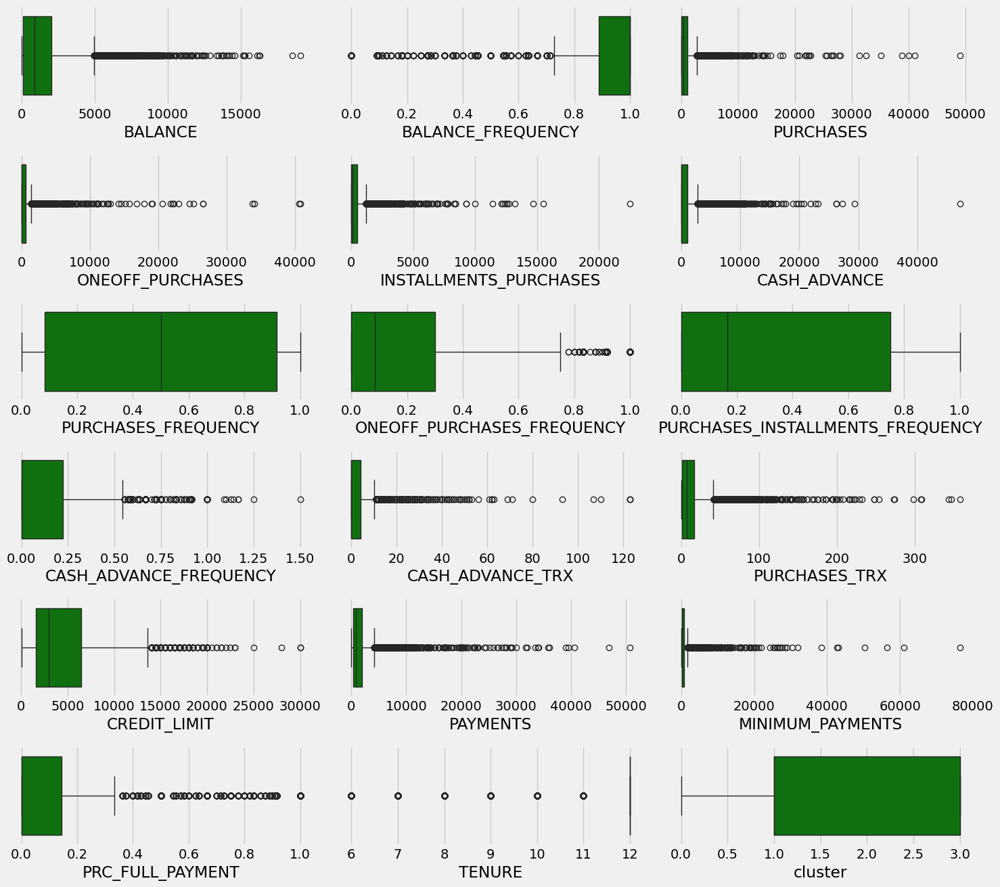

<Figure size 640x480 with 0 Axes>

In [135]:
plt.figure(figsize=(15, 15))

for i, column in enumerate(df.columns, 1):
    plt.subplot(7, 3, i)
    sns.boxplot(x=df[column], color='green', orient='h')
    plt.xlabel(column)    

plt.tight_layout()
plt.show()
plt.savefig('boxplot.png')

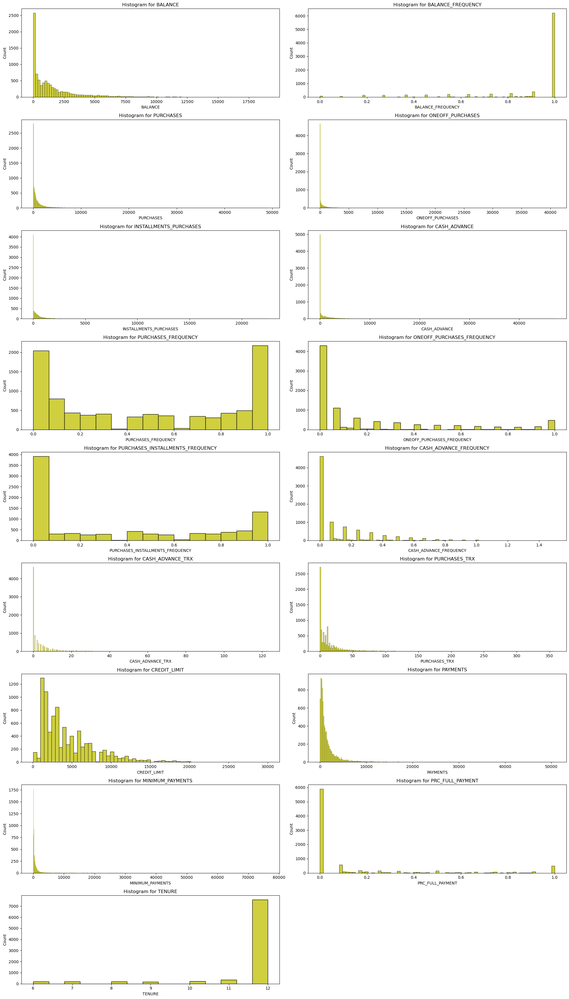

<Figure size 640x480 with 0 Axes>

In [27]:
plt.figure(figsize=(20, 35))

for i, col in enumerate(df.columns):
    ax = plt.subplot(9, 2, i + 1)
    sns.histplot(df[col], color='y', edgecolor='black', ax=ax)
    plt.xlabel(col)
    plt.title(f'Histogram for {col}')   

plt.tight_layout()
plt.show()
plt.savefig('histogram.png')

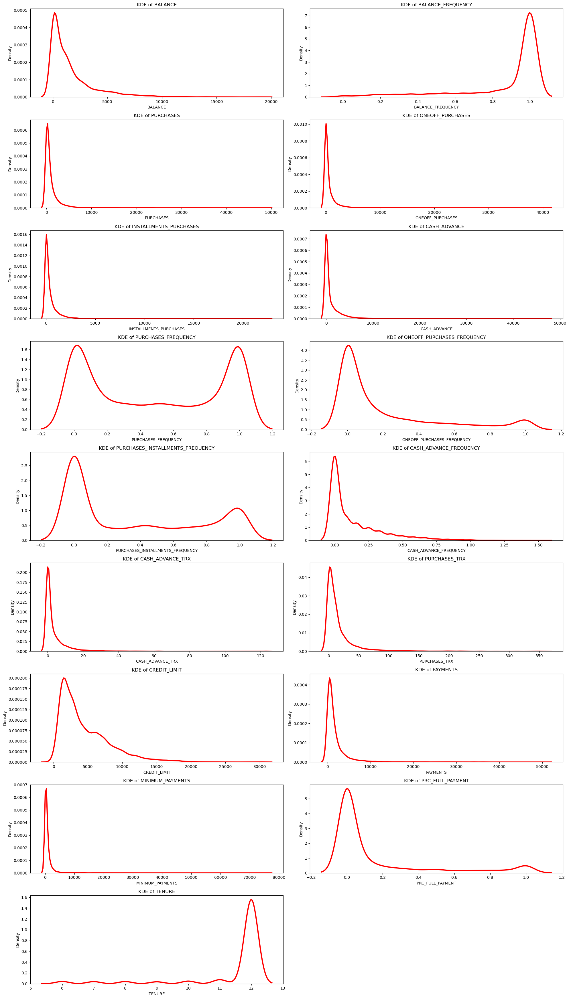

<Figure size 640x480 with 0 Axes>

In [28]:
plt.figure(figsize=(20, 35))

for i, col in enumerate(df.columns):
    ax = plt.subplot(9, 2, i + 1)
    sns.kdeplot(df[col], color='red', lw=3)
    plt.xlabel(col)
    plt.title(f'KDE of {col}')

plt.tight_layout()
plt.show()
plt.savefig('kde.png')

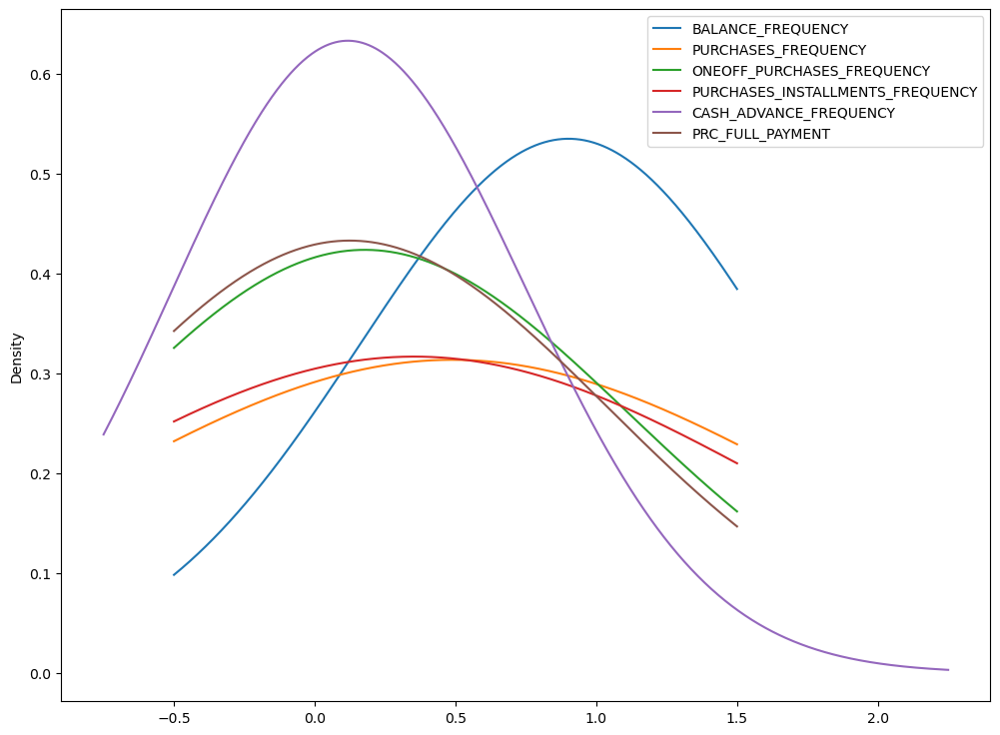

In [29]:
ax = df[['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY',
         'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
         'CASH_ADVANCE_FREQUENCY','PRC_FULL_PAYMENT']].plot.kde(figsize=(12,9), bw_method=3)
plt.savefig('kdeplot.png')

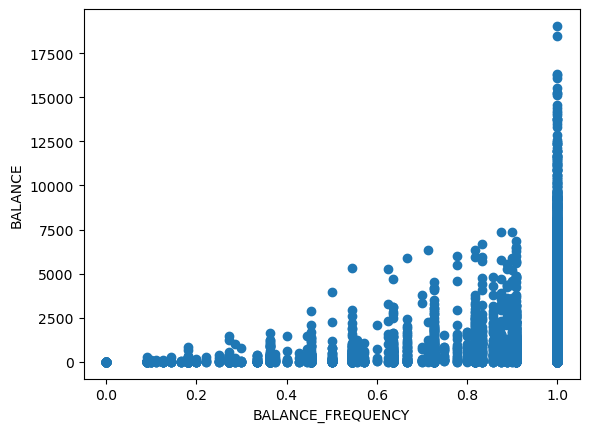

In [30]:
plt.scatter(df['BALANCE_FREQUENCY'], df['BALANCE'])
plt.xlabel('BALANCE_FREQUENCY')
plt.ylabel('BALANCE')
plt.savefig('scatter.png')

## Bivariate Analysis

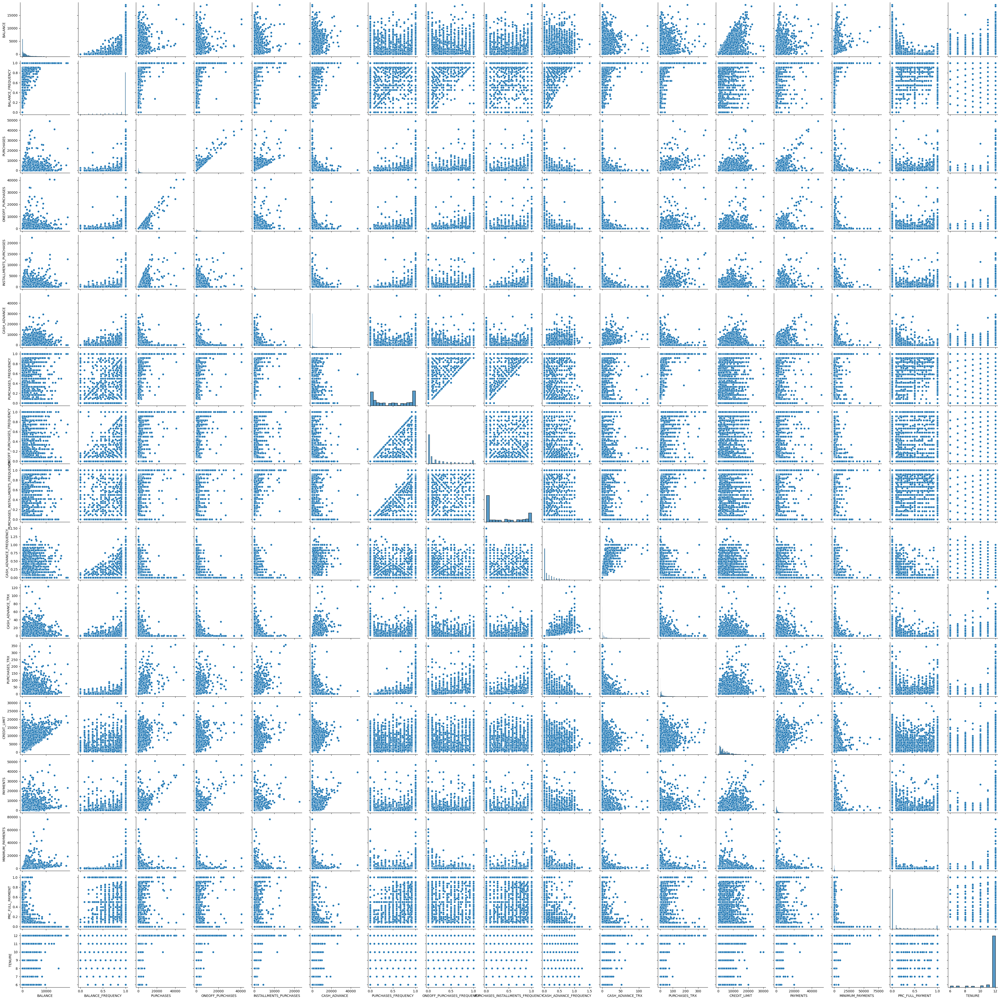

In [32]:
sns.pairplot(df)

plt.savefig('pairplot.png')

## Correlation

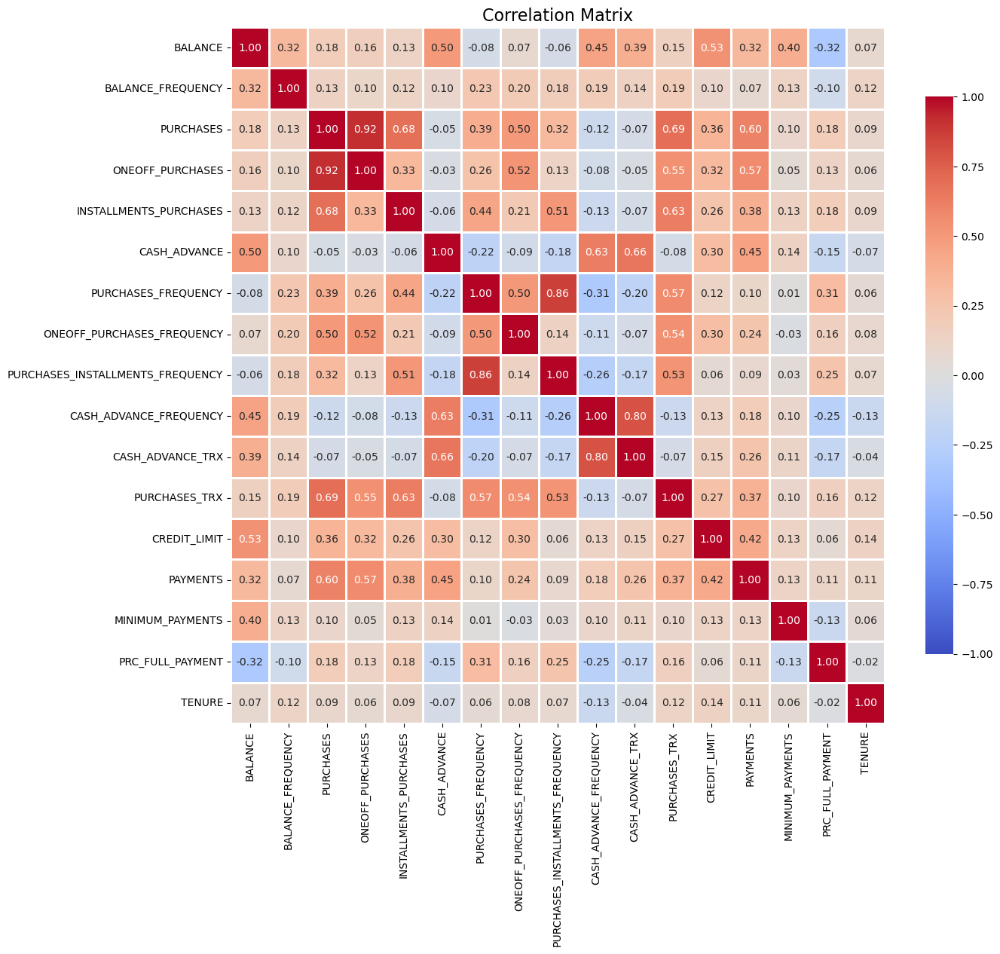

<Figure size 640x480 with 0 Axes>

In [34]:
corr_matrix = df.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    annot=True,
    linewidths=0.8,
    fmt='.2f',
    vmin=-1, vmax=1,
    cbar_kws={'shrink': .8}
)

plt.title('Correlation Matrix', fontsize=16)
plt.show()
plt.savefig('corr_matrix.png')

# K Means

In [36]:
def evaluate_metrics(data_scaled, min_clust=2, max_clust=10, rand_state=42):
    inertias = []
    silhouette = []
    ch_score = []
    db_score = []
    for n_clust in range(min_clust, max_clust):
        kmeans = KMeans(n_clusters=n_clust, random_state=rand_state)
        y_label = kmeans.fit_predict(data_scaled)
        inertias.append(kmeans.inertia_)
        silhouette.append(silhouette_score(data_scaled, y_label))
        ch_score.append(calinski_harabasz_score(data_scaled, y_label))
        db_score.append(davies_bouldin_score(data_scaled, y_label))        

    fig, ax = plt.subplots(2, 2, figsize=(15, 10))
    ax[0][0].plot(range(min_clust, max_clust), inertias, '-x', linewidth=2)
    ax[0][0].set_xlabel('No. of clusters')
    ax[0][0].set_ylabel('Inertia')
    
    ax[0][1].plot(range(min_clust, max_clust), silhouette, '-x', linewidth=2)
    ax[0][1].set_xlabel('No. of clusters')
    ax[0][1].set_ylabel('Silhouette Score')
    
    ax[1][0].plot(range(min_clust, max_clust), ch_score, '-x', linewidth=2)
    ax[1][0].set_xlabel('No. of clusters')
    ax[1][0].set_ylabel('Calinski Harabasz Score')
    
    ax[1][1].plot(range(min_clust, max_clust), db_score, '-x', linewidth=2)
    ax[1][1].set_xlabel('No. of clusters')
    ax[1][1].set_ylabel('Davies Bouldin Score')
    fig.suptitle('Metrics to evaluate the number of clusters')
    plt.show()

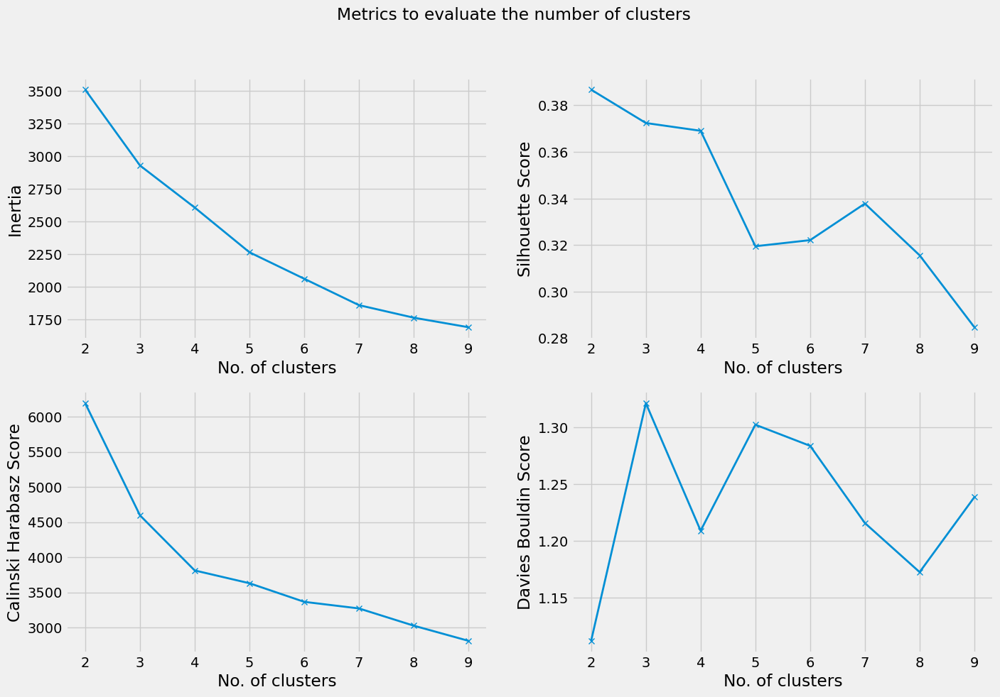

In [125]:
evaluate_metrics(data_scaled, min_clust=2, max_clust=10, rand_state=42)

Silhouette Score

In [39]:
X = data_scaled.values

for n in range(2, 11):
    kmeans = KMeans(n_clusters=n, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(f"For n_clusters = {n}, the silhouette score is {silhouette_avg:.4f}")

For n_clusters = 2, the silhouette score is 0.3867
For n_clusters = 3, the silhouette score is 0.3724
For n_clusters = 4, the silhouette score is 0.3691
For n_clusters = 5, the silhouette score is 0.3195
For n_clusters = 6, the silhouette score is 0.3221
For n_clusters = 7, the silhouette score is 0.3378
For n_clusters = 8, the silhouette score is 0.3156
For n_clusters = 9, the silhouette score is 0.2847
For n_clusters = 10, the silhouette score is 0.3001


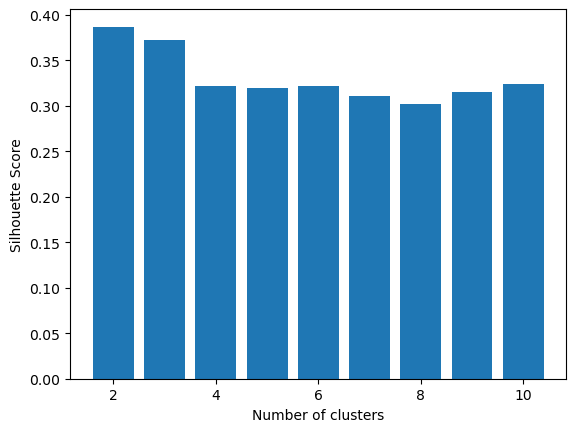

In [40]:
silhouette_scores = [] 

for n_cluster in range(2, 11):
    silhouette_scores.append( 
        silhouette_score(data_scaled, KMeans(n_clusters = n_cluster).fit_predict(data_scaled))) 
    
k = [2, 3, 4, 5, 6,7,8,9,10] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show()

# Applying KMeans

In [42]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(data_scaled)
labels = kmeans.labels_

In [43]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.102272,0.979029,0.066065,0.060480,0.034425,0.014217,0.900144,0.827593,0.462023,0.061885,0.018584,0.119053,0.223018,0.064494,0.009778,0.246372,0.961498
1,0.081130,0.925216,0.023815,0.008942,0.035733,0.014684,0.878117,0.128604,0.826689,0.063566,0.019736,0.064029,0.134701,0.030603,0.015357,0.060123,0.935009
2,0.091977,0.838691,0.005779,0.005661,0.002346,0.029413,0.136931,0.080776,0.055332,0.127397,0.036746,0.007152,0.136313,0.029141,0.010945,0.043756,0.906872
3,0.005920,0.810822,0.022027,0.008078,0.033411,0.001000,0.752936,0.113991,0.662466,0.005473,0.001334,0.046498,0.137404,0.025382,0.002361,0.813009,0.886347


In [44]:
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [df.columns])
cluster_centers

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1947.575209,0.979029,3239.817768,2465.256265,774.561504,670.129257,0.900144,0.827593,0.462023,0.092828,2.285826,42.620987,6729.402719,3271.237102,747.070353,0.246372,11.768990
1,1544.960960,0.925216,1167.891979,364.491735,803.989737,692.171533,0.878117,0.128604,0.826689,0.095349,2.427536,22.922554,4084.293798,1552.242849,1173.405128,0.060123,11.610054
2,1751.523238,0.838691,283.403377,230.765012,52.784141,1386.428373,0.136931,0.080776,0.055332,0.191095,4.519807,2.560298,4132.567081,1478.093424,836.228581,0.043756,11.441234
3,112.737382,0.810822,1080.201395,329.262422,751.741406,47.137742,0.752936,0.113991,0.662466,0.008210,0.164062,16.646205,4165.240632,1287.395796,180.383074,0.813009,11.318080


In [45]:
df_cluster_with_kmean = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_kmean

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,2
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,2
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,3
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,1
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,2


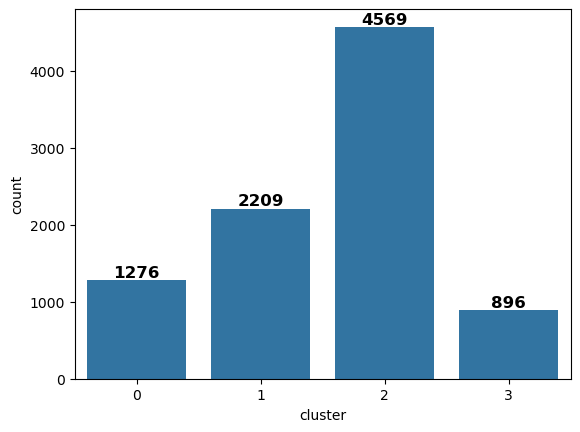

In [46]:
ax = sns.countplot(x=df_cluster_with_kmean.cluster)
ax.bar_label(ax.containers[0], fontsize=12, color='black', fontweight='bold')
plt.show()

# Feature Importance

In [48]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier  
from sklearn.model_selection import train_test_split

In [49]:
X = df_cluster_with_kmean. drop('cluster', axis =1)
y = df_cluster_with_kmean['cluster']

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [51]:
clf = DecisionTreeClassifier(max_depth = 3)

In [52]:
clf = clf.fit(X_train,y_train)

In [53]:
y_pred = clf.predict(X_test)

In [54]:
feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_scores

PURCHASES_FREQUENCY                 0.535501
ONEOFF_PURCHASES_FREQUENCY          0.224550
PRC_FULL_PAYMENT                    0.212430
PURCHASES_INSTALLMENTS_FREQUENCY    0.027519
CASH_ADVANCE_TRX                    0.000000
MINIMUM_PAYMENTS                    0.000000
PAYMENTS                            0.000000
CREDIT_LIMIT                        0.000000
PURCHASES_TRX                       0.000000
BALANCE                             0.000000
CASH_ADVANCE_FREQUENCY              0.000000
BALANCE_FREQUENCY                   0.000000
CASH_ADVANCE                        0.000000
INSTALLMENTS_PURCHASES              0.000000
ONEOFF_PURCHASES                    0.000000
PURCHASES                           0.000000
TENURE                              0.000000
dtype: float64

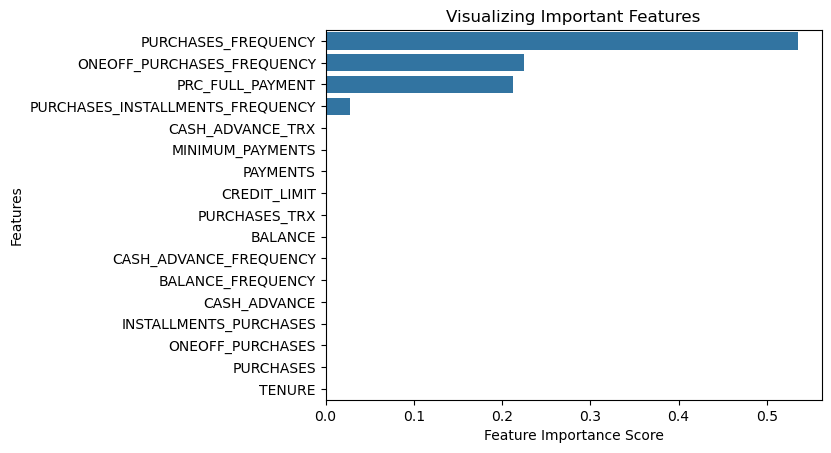

In [55]:
sns.barplot(x=feature_scores, y=feature_scores.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

# Feature Extraction using PCA

In [57]:
df_kmean = df.copy()

pca = PCA(n_components = 2)
principal_comp = pca.fit_transform(df_kmean)
pca_df = pd.DataFrame(data = principal_comp, columns = ['pca1', 'pca2'])
pca_df.head()

,pca1,pca2
0,-4323.555853,915.328615
1,4121.573080,-2439.419615
2,1499.224549,-2005.600605
3,1279.321191,-1334.289067
4,-3740.230210,751.680487


In [58]:
pca_df = pd.DataFrame(data = principal_comp, columns = ['pca1', 'pca2'])

pca_df = pd.concat([pca_df, pd.DataFrame({'cluster':labels})], axis=1)
pca_df.head()

,pca1,pca2,cluster
0,-4323.555853,915.328615,2
1,4121.573080,-2439.419615,2
2,1499.224549,-2005.600605,0
3,1279.321191,-1334.289067,2
4,-3740.230210,751.680487,2


# Visualization of PCA

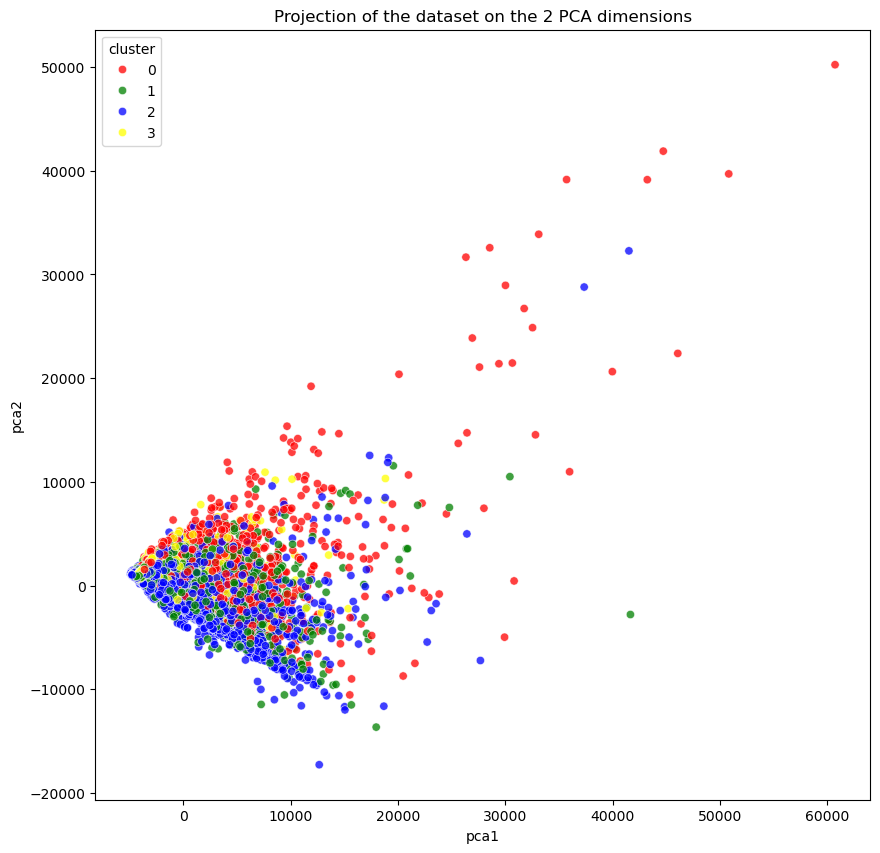

In [60]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='pca1', y='pca2',hue = 'cluster', data = pca_df, palette=['red','green','blue','yellow'], alpha=0.75)
plt.title('Projection of the dataset on the 2 PCA dimensions')
plt.show()

# TSNE

In [62]:
tsne = TSNE(n_components=2, 
            perplexity=50,  
            random_state=42,
            n_iter=300).fit_transform(df_kmean)

In [63]:
df_embed = pd.DataFrame(tsne, columns=['feature1', 'feature2'])
df_embed['cluster']= pd.DataFrame({'cluster': labels})
df_embed

,feature1,feature2,cluster
0,-10.836474,1.539391,2
1,4.071030,-4.853559,2
2,5.501009,0.050460,0
3,5.303742,3.185943,2
4,-9.092174,-4.047123,2
...,...,...,...
8945,-9.463824,2.454603,3
8946,-9.539925,4.070321,1
8947,-10.963658,1.632302,1
8948,-11.011167,-1.166392,2


[Text(0.5, 1.0, 'All Data')]

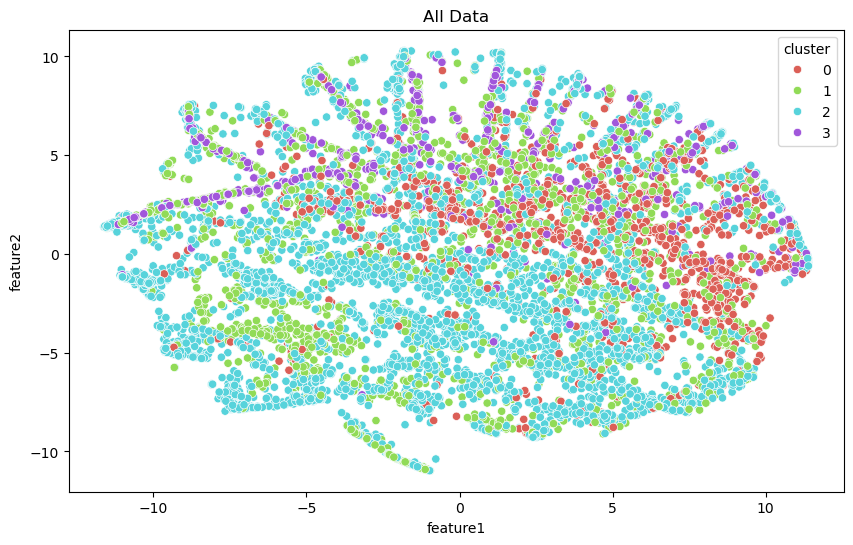

In [64]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='feature1', y='feature2',
    data=df_embed,    
    hue=df_embed['cluster'],
    palette=sns.color_palette("hls", 4)
).set(title='All Data')

# Hierarchial Clustering

In [66]:
siliuette_list_hierarchical = []

for cluster in range(2,20,1):
    for linkage_method in ['ward', 'average', 'complete']:
        agglomerative = AgglomerativeClustering(linkage=linkage_method,n_clusters=cluster).fit_predict(data_scaled)
        sil_score = metrics.silhouette_score(data_scaled, agglomerative, metric='euclidean')
        siliuette_list_hierarchical.append((cluster, sil_score, linkage_method, len(set(agglomerative)) ) )
        
df_hierarchical = pd.DataFrame(siliuette_list_hierarchical, columns=['cluster', 'sil_score','linkage_method', 'number_of_clusters'])

In [67]:
df_hierarchical.sort_values('sil_score', ascending=False)

,cluster,sil_score,linkage_method,number_of_clusters
1,2,0.457340,average,2
4,3,0.430055,average,3
2,2,0.392568,complete,2
0,2,0.359535,ward,2
7,4,0.343081,average,4
3,3,0.335982,ward,3
5,3,0.317401,complete,3
19,8,0.308131,average,8
22,9,0.307027,average,9
31,12,0.303240,average,12


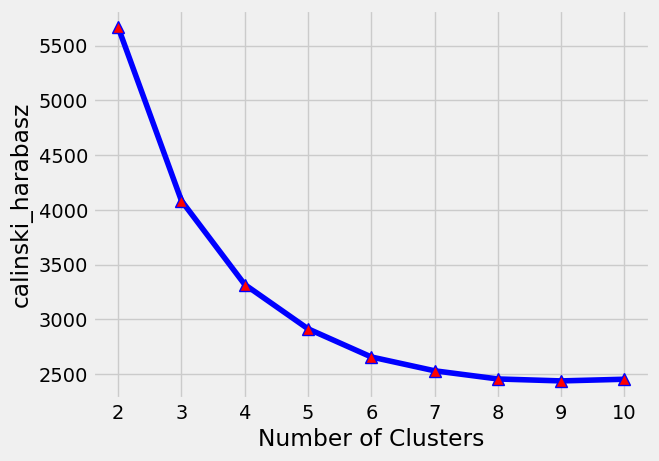

In [68]:
calinski_harabaz = []
for k in range (2,11):
    Hierarch = AgglomerativeClustering(n_clusters = k, linkage='ward')
    score = metrics.calinski_harabasz_score(data_scaled, Hierarch.fit_predict(data_scaled))
    calinski_harabaz.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz, marker = '^', c = 'b', ms = 9, mfc = 'r')
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [69]:
Hierarch = AgglomerativeClustering(n_clusters =2,linkage='ward')
Hierarch.fit(data_scaled)
score = silhouette_score(data_scaled, Hierarch.fit_predict(data_scaled))
print("silhouette_score",score)

silhouette_score 0.35953456313371285


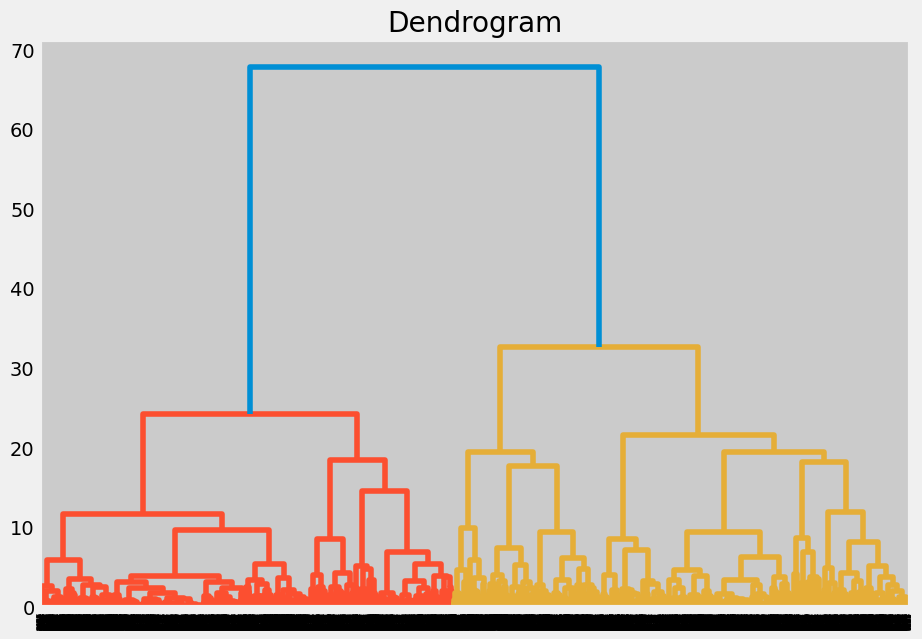

In [70]:
plt.figure(figsize=(10,7))
plt.title("Dendrogram")
dend=shc.dendrogram(shc.linkage(data_scaled,method='ward'))

In [71]:
labels = Hierarch.labels_
df_cluster_with_Hierarch = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_Hierarch

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


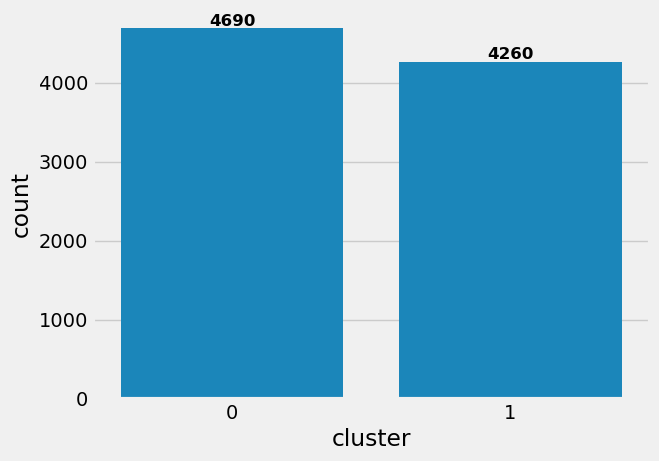

In [72]:
ax = sns.countplot(x=df_cluster_with_Hierarch.cluster)
ax.bar_label(ax.containers[0], fontsize=12, color='black', fontweight='bold')
plt.show()

In [73]:
Hierarch = AgglomerativeClustering(n_clusters = 2).fit(df)

df_Hierarch = df.copy()
df_Hierarch['cluster'] = Hierarch.labels_

In [74]:
pca = PCA(n_components=2)
principal_comp = pca.fit_transform(data_scaled)
principal_comp

array([[-0.48216737, -0.09765437],
       [-0.60857623, -0.01938067],
       [ 0.3045062 ,  0.92093925],
       ...,
       [ 0.36038464, -0.42266401],
       [-0.64609933, -0.20436362],
       [-0.09460179,  0.3995473 ]])

In [75]:
pca_df = pd.DataFrame(data = principal_comp, columns =['pca1','pca2'])
pca_df.head()

,pca1,pca2
0,-0.482167,-0.097654
1,-0.608576,-0.019381
2,0.304506,0.920939
3,-0.588626,-0.005647
4,-0.554356,0.052973


In [76]:
pca_df = pd.concat([pca_df,pd.DataFrame({'cluster':labels})], axis = 1)
pca_df.head()

,pca1,pca2,cluster
0,-0.482167,-0.097654,1
1,-0.608576,-0.019381,1
2,0.304506,0.920939,0
3,-0.588626,-0.005647,1
4,-0.554356,0.052973,1


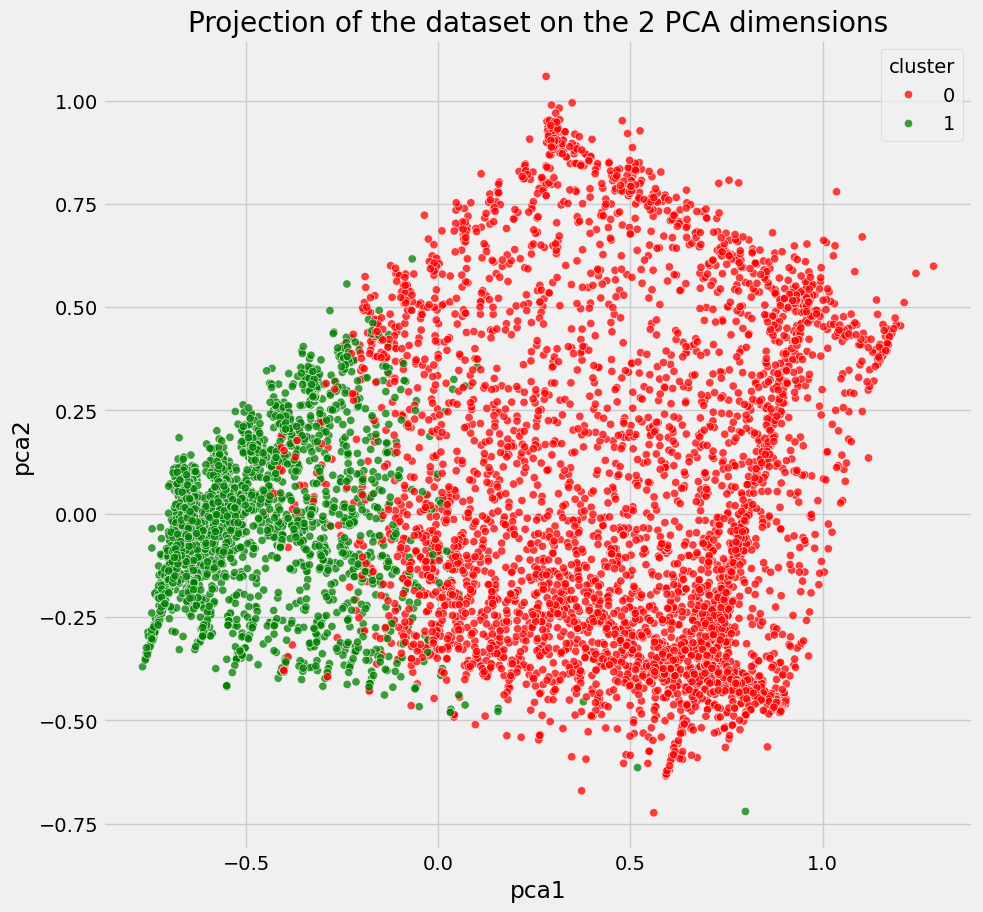

In [77]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='pca1', y='pca2',hue = 'cluster', data = pca_df, palette=['red','green',], alpha=0.75)
plt.title('Projection of the dataset on the 2 PCA dimensions')
plt.show()

In [78]:
tsne = TSNE(n_components=2, 
            perplexity=50,  
            random_state=42,
            n_iter=300).fit_transform(df_cluster_with_Hierarch)
df_embed = pd.DataFrame(tsne, columns=['feature1', 'feature2'])
df_embed['cluster']= pd.DataFrame({'cluster': labels})
df_embed

,feature1,feature2,cluster
0,-10.833850,1.550213,1
1,4.067219,-4.858552,1
2,5.501130,0.047184,0
3,5.307894,3.180190,1
4,-9.095262,-4.038126,1
...,...,...,...
8945,-9.460193,2.463299,0
8946,-9.534945,4.078820,0
8947,-10.960932,1.643378,0
8948,-11.011936,-1.155916,1


[Text(0.5, 1.0, 'All Data')]

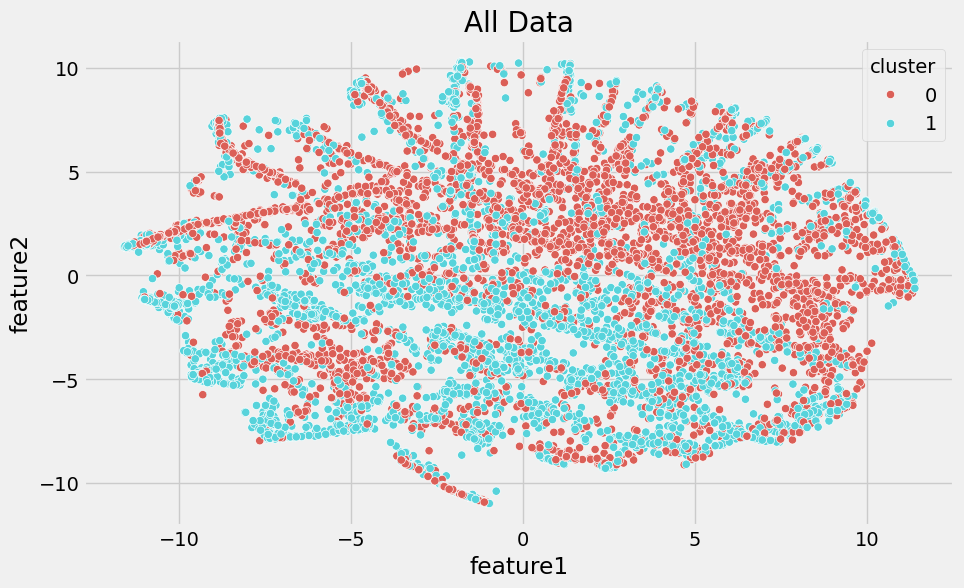

In [79]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='feature1', y='feature2',
    data=df_embed,    
    hue=df_embed['cluster'],
    palette=sns.color_palette("hls", 2)
).set(title='All Data')

# Gaussian Mixture

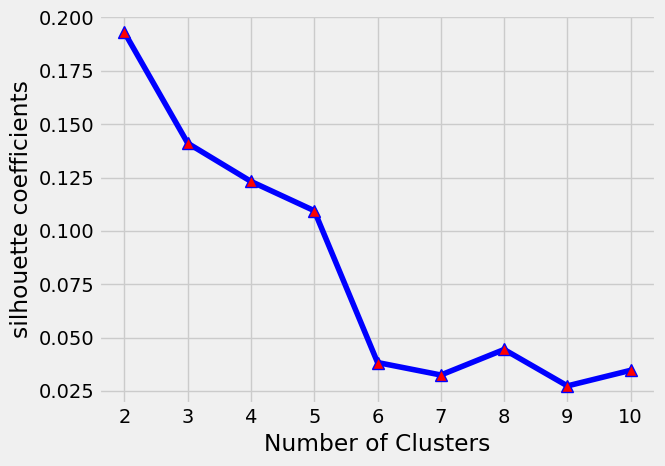

In [81]:
score_gmm = []
for k in range(2,11):
    gmm = GaussianMixture(n_components=k, random_state=1 )
    gmm.fit(data_scaled)
    score = silhouette_score(data_scaled, gmm.predict(data_scaled), metric='euclidean',random_state=42)
    score_gmm.append(score)
plt.plot(range(2,11), score_gmm, marker = '^', c = 'b', ms = 9, mfc = 'r')
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show() 

In [82]:
best_silhouette = -1
best_n_components = 0

for n in range(2, 11):
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm_labels = gmm.fit_predict(X)
    silhouette_avg = silhouette_score(X, gmm_labels)
    print(f"For n_components = {n}, the silhouette score is {silhouette_avg:.4f}")
    
    if silhouette_avg > best_silhouette:
        best_silhouette = silhouette_avg
        best_n_components = n
        
print(f"Best silhouette score: {best_silhouette:.4f} with n_components = {best_n_components}")

For n_components = 2, the silhouette score is 0.4863
For n_components = 3, the silhouette score is 0.0228
For n_components = 4, the silhouette score is -0.0482
For n_components = 5, the silhouette score is -0.1643
For n_components = 6, the silhouette score is -0.2246
For n_components = 7, the silhouette score is -0.1165
For n_components = 8, the silhouette score is -0.1649
For n_components = 9, the silhouette score is -0.0321
For n_components = 10, the silhouette score is -0.1303
Best silhouette score: 0.4863 with n_components = 2


In [83]:
covariance_types = ['full', 'tied', 'diag', 'spherical']
best_silhouette = -1
best_covariance_type = None

for cov_type in covariance_types:
    gmm = GaussianMixture(n_components=2, covariance_type=cov_type, random_state=42)
    gmm_labels = gmm.fit_predict(X)
    silhouette_avg = silhouette_score(X, gmm_labels)
    print(f"For covariance_type = {cov_type}, the silhouette score is {silhouette_avg:.4f}")
    
    if silhouette_avg > best_silhouette:
        best_silhouette = silhouette_avg
        best_covariance_type = cov_type

print(f"Best silhouette score: {best_silhouette:.4f} with covariance_type = {best_covariance_type}")

For covariance_type = full, the silhouette score is 0.4863
For covariance_type = tied, the silhouette score is 0.5168
For covariance_type = diag, the silhouette score is 0.3161
For covariance_type = spherical, the silhouette score is 0.3597
Best silhouette score: 0.5168 with covariance_type = tied


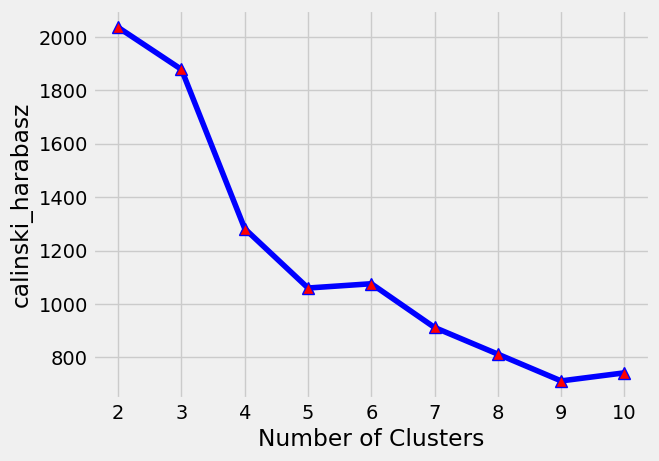

In [84]:
calinski_harabaz = []
for k in range (2,11):
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(data_scaled)
    metrics.calinski_harabasz_score(data_scaled, gmm.predict(data_scaled))
    calinski_harabaz.append(metrics.calinski_harabasz_score(data_scaled, gmm.predict(data_scaled)))
plt.plot(range(2,11), calinski_harabaz, marker = '^', c = 'b', ms = 9, mfc = 'r')
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

In [85]:
gmm = GaussianMixture(n_components=2, covariance_type='tied', random_state=42)
gmm.fit(data_scaled)
labels = gmm.predict(data_scaled)
cluster_means = pd.DataFrame(data = gmm.means_, columns = [df.columns])
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.086908,0.820728,0.006053,0.005617,0.003024,0.027527,0.142914,0.077127,0.065341,0.118653,0.033997,0.007568,0.136283,0.028745,0.010530,0.079685,0.911776
1,0.076876,0.940063,0.036453,0.024437,0.035200,0.013259,0.876186,0.341640,0.696591,0.058383,0.017992,0.078315,0.161847,0.040195,0.011538,0.235926,0.928190


In [86]:
cluster_means = scaler.inverse_transform(cluster_means)
cluster_means = pd.DataFrame(data = cluster_means, columns = [df.columns])
cluster_means

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1654.994344,0.820728,296.818678,228.972497,68.036545,1297.548358,0.142914,0.077127,0.065341,0.177980,4.181582,2.709224,4131.678664,1457.965814,804.556868,0.079685,11.470656
1,1463.951027,0.940063,1787.661314,996.072653,792.010797,624.973420,0.876186,0.341640,0.696591,0.087574,2.212983,28.036758,4897.313935,2038.734772,881.539000,0.235926,11.569139


In [87]:
df_cluster_with_gmm = pd.concat([df, pd.DataFrame({'cluster': labels})], axis = 1)
df_cluster_with_gmm

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,1
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


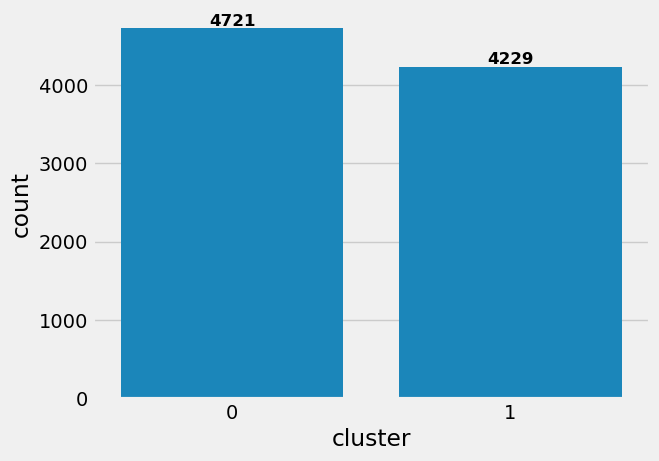

In [88]:
ax = sns.countplot(x=df_cluster_with_gmm.cluster)
ax.bar_label(ax.containers[0], fontsize=12, color='black', fontweight='bold')
plt.show()

In [89]:
tsne = TSNE(n_components=2, 
            perplexity=50,  
            random_state=42,
            n_iter=300).fit_transform(df_cluster_with_gmm)

In [90]:
df_embed = pd.DataFrame(tsne, columns=['feature1', 'feature2'])
df_embed['cluster']= pd.DataFrame({'cluster': labels})
df_embed

,feature1,feature2,cluster
0,-10.836782,1.535989,0
1,4.071734,-4.851636,0
2,5.501761,0.051362,1
3,5.303842,3.187201,0
4,-9.090968,-4.049675,0
...,...,...,...
8945,-9.464728,2.451928,1
8946,-9.541037,4.067701,1
8947,-10.964010,1.628837,1
8948,-11.010527,-1.169606,0


[Text(0.5, 1.0, 'All Data')]

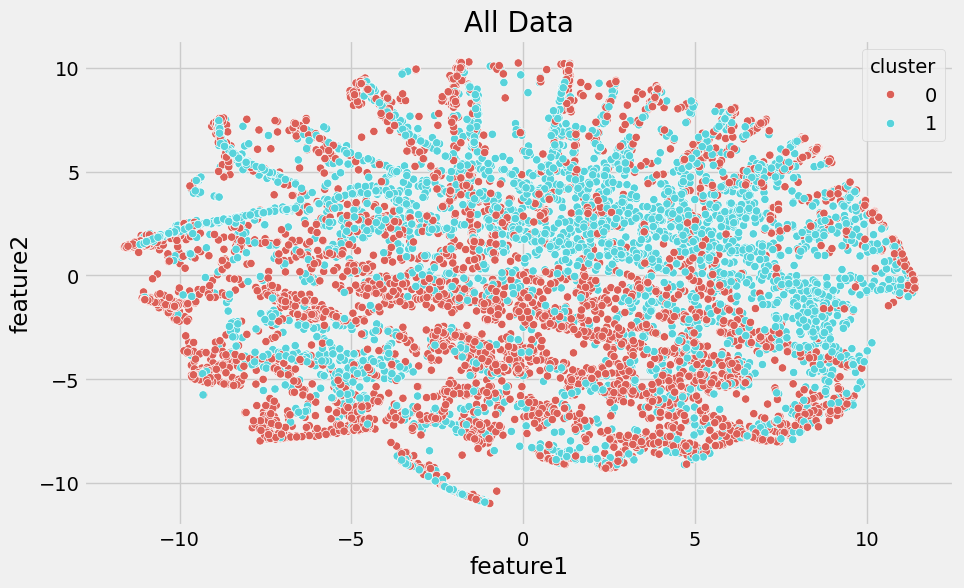

In [91]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='feature1', y='feature2',
    data=df_embed,    
    hue=df_embed['cluster'],
    palette=sns.color_palette("hls", 2)
).set(title='All Data')

# DBSCAN

In [93]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

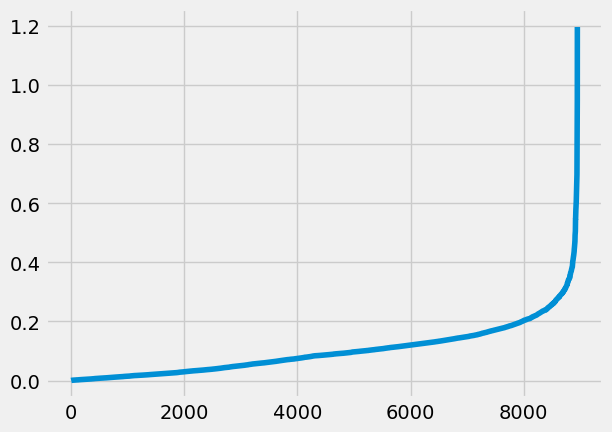

In [94]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=4)
nbrs = neigh.fit(data_scaled)
distances, indices = nbrs.kneighbors(data_scaled)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [95]:
eps_values = np.arange(0.1, 2.0, 0.1)
min_samples_values = range(2, 20)

best_score = -1
best_params = {'eps': None, 'min_samples': None}

In [96]:
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(data_scaled)

        if len(set(labels)) > 1:
            score = silhouette_score(data_scaled, labels)
            if score > best_score:
                best_score = score
                best_params = {'eps': eps, 'min_samples': min_samples}

In [97]:
print(f"Best Silhouette Score: {best_score}")
print(f"Optimal Epsilon: {best_params['eps']}")
print(f"Optimal Min Samples: {best_params['min_samples']}")

Best Silhouette Score: 0.46696572497020117
Optimal Epsilon: 1.0
Optimal Min Samples: 2


In [98]:
dbscan = DBSCAN(eps=1, min_samples=2)
dbscan.fit(data_scaled)
Labels = dbscan.labels_
Labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [99]:
dbscan_df = pd.DataFrame(data_scaled, columns = df.columns)
dbscan_df['clusters'] = Labels
dbscan_df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,clusters
0,0.002148,0.818182,0.001945,0.000000,0.00424,0.000000,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003979,0.001826,0.000000,1.0,0
1,0.168169,0.909091,0.000000,0.000000,0.00000,0.136685,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080893,0.014035,0.222222,1.0,0
2,0.131026,1.000000,0.015766,0.018968,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012264,0.008210,0.000000,1.0,0
3,0.087521,0.636364,0.030567,0.036775,0.00000,0.004366,0.083333,0.083333,0.000000,0.055555,0.00813,0.002793,0.248748,0.000000,0.000000,0.000000,1.0,0
4,0.042940,1.000000,0.000326,0.000393,0.00000,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013374,0.003204,0.000000,1.0,0


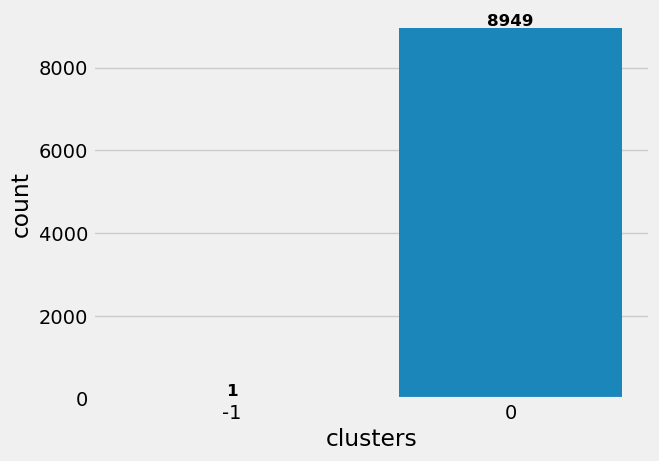

In [100]:
ax = sns.countplot(x=dbscan_df.clusters)
ax.bar_label(ax.containers[0], fontsize=12, color='black', fontweight='bold')
plt.show()

In [101]:
sil_score = metrics.silhouette_score(data_scaled, dbscan.labels_, metric='euclidean')
sil_score

0.46696572497020117

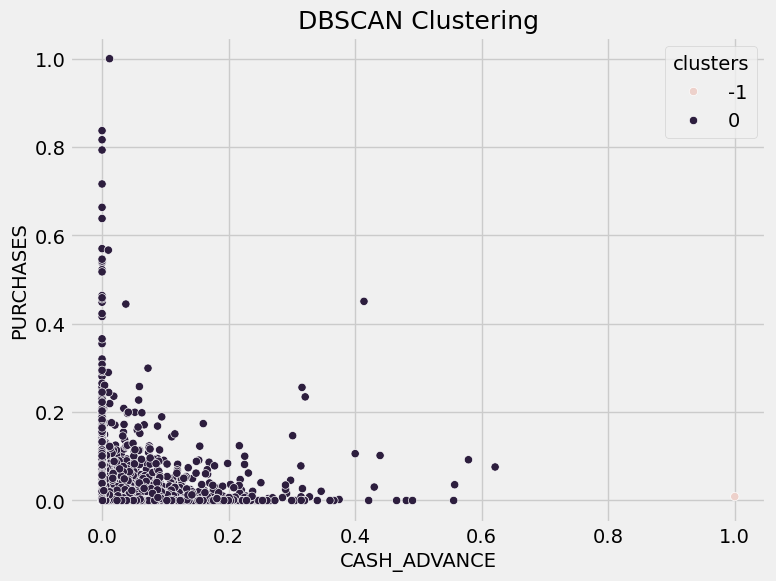

In [102]:
plt.figure(figsize=(8,6))

sns.scatterplot(
    x='CASH_ADVANCE', 
    y='PURCHASES',
    data=dbscan_df,    
    hue=dbscan_df['clusters']
)

plt.title('DBSCAN Clustering',fontsize=18)
plt.xlabel('CASH_ADVANCE',fontsize=14)
plt.ylabel('PURCHASES',fontsize=14)
plt.show()

# Model Evaluation

In [104]:
kmeans_eval = KMeans(n_clusters=4, random_state=42).fit_predict(data_scaled)
gmm_eval = GaussianMixture(n_components=2, covariance_type='tied', random_state=40).fit_predict(data_scaled)
ac_eval = AgglomerativeClustering(linkage='ward', n_clusters=2).fit_predict(data_scaled)
dbscan_eval = DBSCAN(eps=1, min_samples=2).fit_predict(data_scaled)

In [105]:
kmeans_silhouette = silhouette_score(data_scaled, kmeans_eval)
kmeans_ch = calinski_harabasz_score(data_scaled, kmeans_eval)

gmm_silhouette = silhouette_score(data_scaled, gmm_eval)
gmm_ch = calinski_harabasz_score(data_scaled, gmm_eval)

ac_silhouette = silhouette_score(data_scaled, ac_eval)
ac_ch = calinski_harabasz_score(data_scaled, ac_eval)

dbscan_silhouette = silhouette_score(data_scaled, dbscan_eval)
dbscan_ch = calinski_harabasz_score(data_scaled, dbscan_eval)

results_df = pd.DataFrame({
    'Model': ['KMeans', 'Gaussian Mixture', 'Agglomerative Clustering', 'DBSCAN'],
    'Number of Clusters': [4, 2, 2, len(set(dbscan_eval)) - (1 if -1 in dbscan_eval else 0)],
    'Silhouette Score': [kmeans_silhouette, gmm_silhouette, ac_silhouette, dbscan_silhouette],
    'Calinski-Harabasz Score': [kmeans_ch, gmm_ch, ac_ch, dbscan_ch]
})


In [106]:
results_df

,Model,Number of Clusters,Silhouette Score,Calinski-Harabasz Score
0,KMeans,4,0.369079,3811.578290
1,Gaussian Mixture,2,0.376571,5982.472152
2,Agglomerative Clustering,2,0.359535,5665.943960
3,DBSCAN,1,0.466966,5.059781


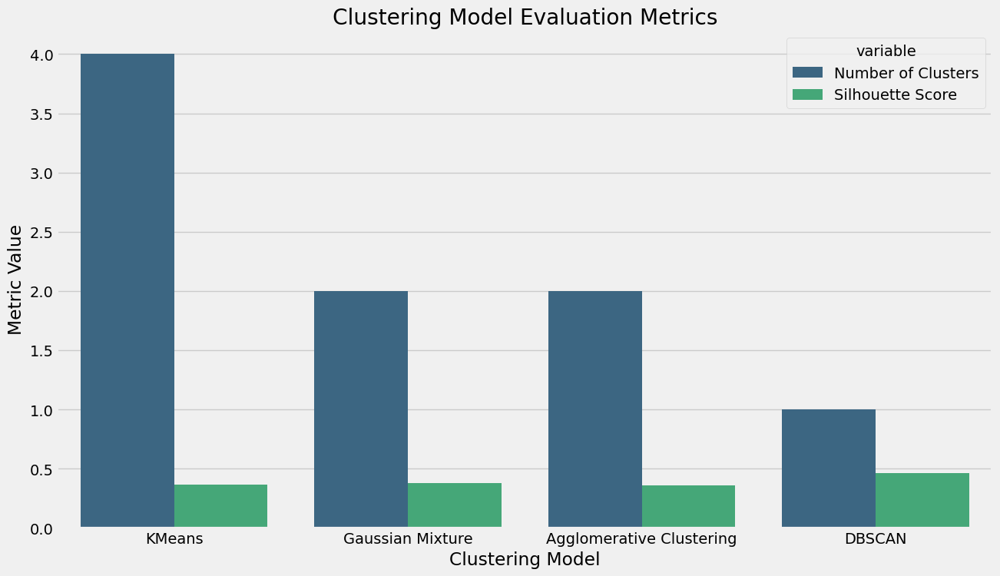

In [107]:
results_melted = pd.melt(results_df, id_vars=['Model'], value_vars=['Number of Clusters', 'Silhouette Score'])
plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='value', hue='variable', data=results_melted, palette='viridis')
plt.title('Clustering Model Evaluation Metrics')
plt.xlabel('Clustering Model')
plt.ylabel('Metric Value')
plt.show()

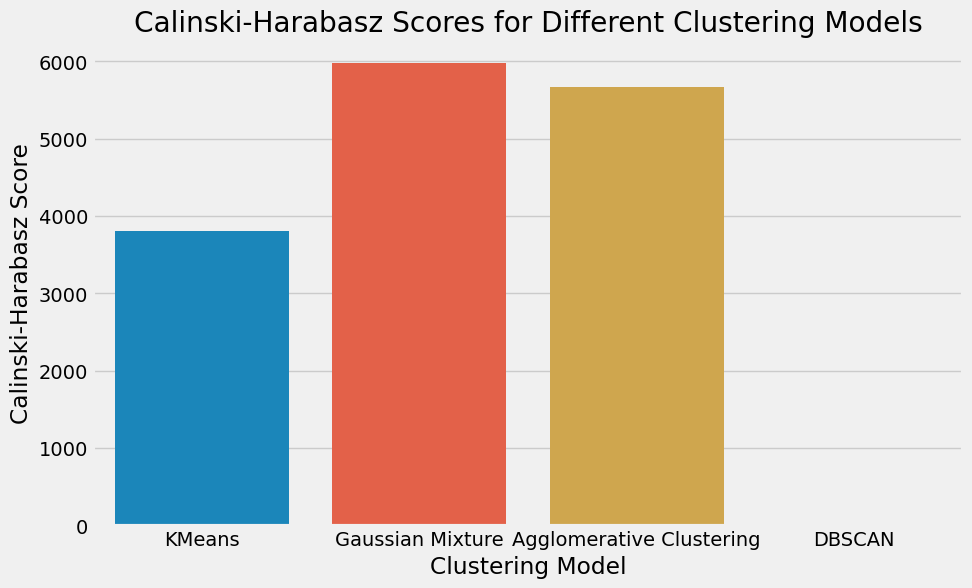

In [108]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Calinski-Harabasz Score', data=results_df, hue='Model')
plt.title('Calinski-Harabasz Scores for Different Clustering Models')
plt.xlabel('Clustering Model')
plt.ylabel('Calinski-Harabasz Score')
plt.show()

# Understanding Clusters by Customer Segmentation

https://github.com/andreduong-zz/credit-card-clustering/blob/master/credit-card-clustering.ipynb

In [111]:
best_columns = ["BALANCE", "PURCHASES", "CASH_ADVANCE", "CREDIT_LIMIT", "PAYMENTS", "MINIMUM_PAYMENTS", "TENURE"]

In [113]:
k_means_visual = KMeans(n_clusters=4, random_state=42).fit(df)
df['cluster'] = k_means_visual.labels_

best_columns.append("cluster")

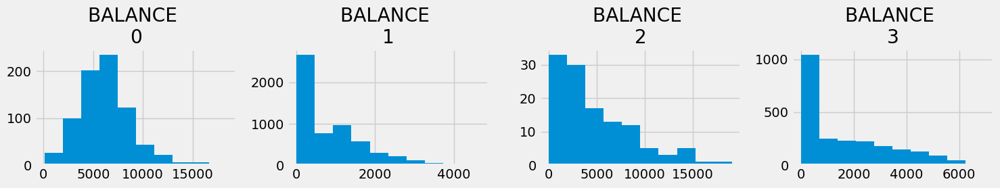

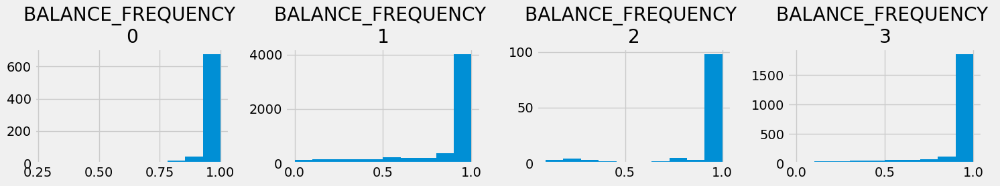

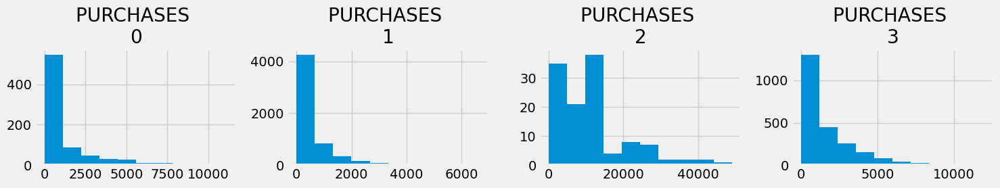

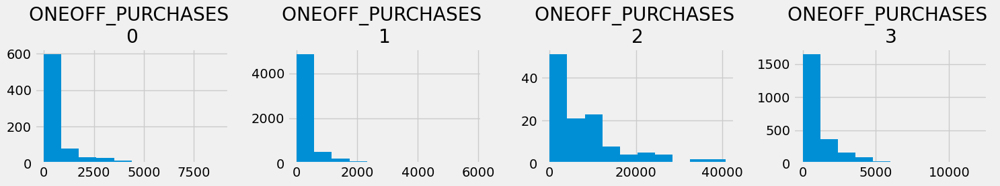

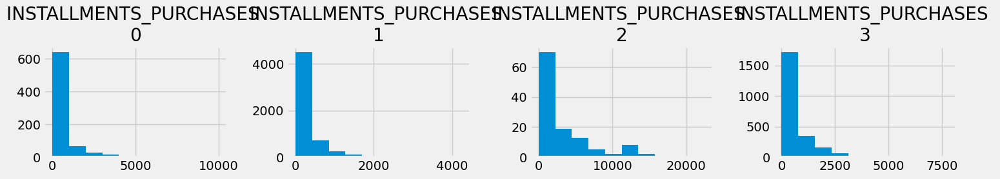

...

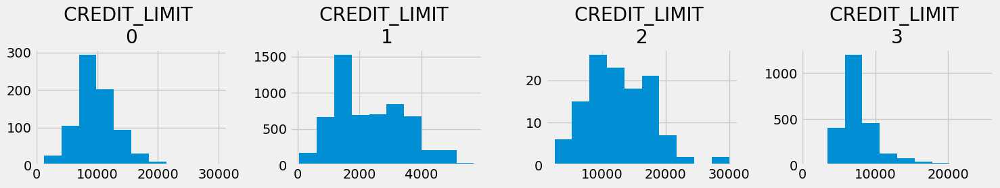

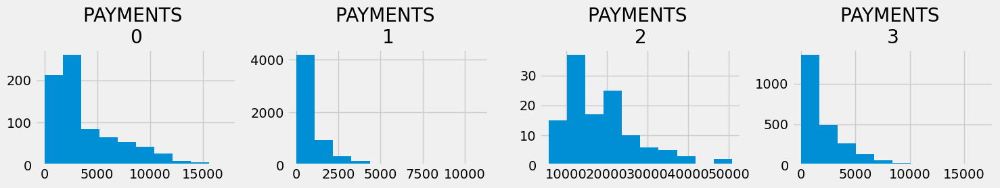

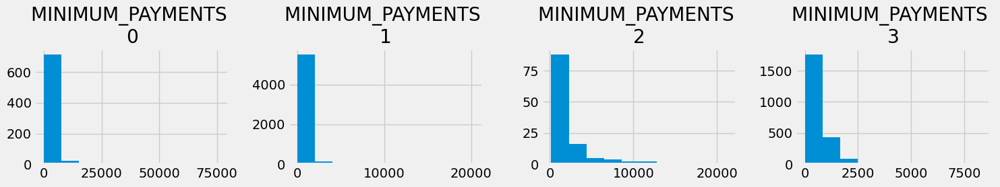

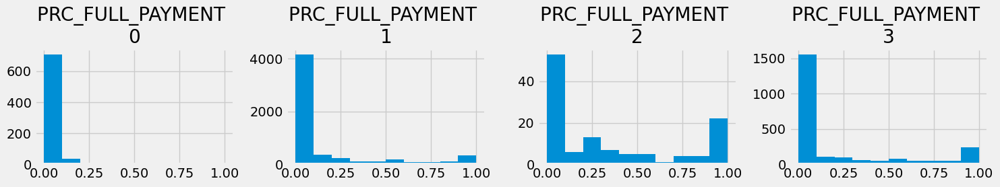

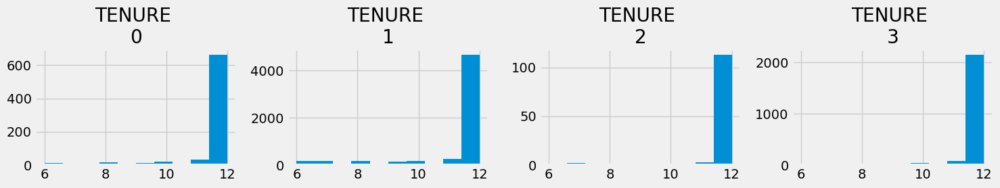

<Figure size 640x480 with 0 Axes>

In [127]:
col_list= ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE']

for column in col_list:
    plt.figure(figsize=(15,3))
    for i in range(0,4):
        plt.subplot(1,4,i+1)
        cluster = df[df['cluster']==i]
        cluster[column].hist()
        plt.title('{} \n{}'.format(column, i))
        
    plt.tight_layout()
    plt.show()

plt.savefig('cluster uni.png')

<Figure size 2500x2500 with 0 Axes>

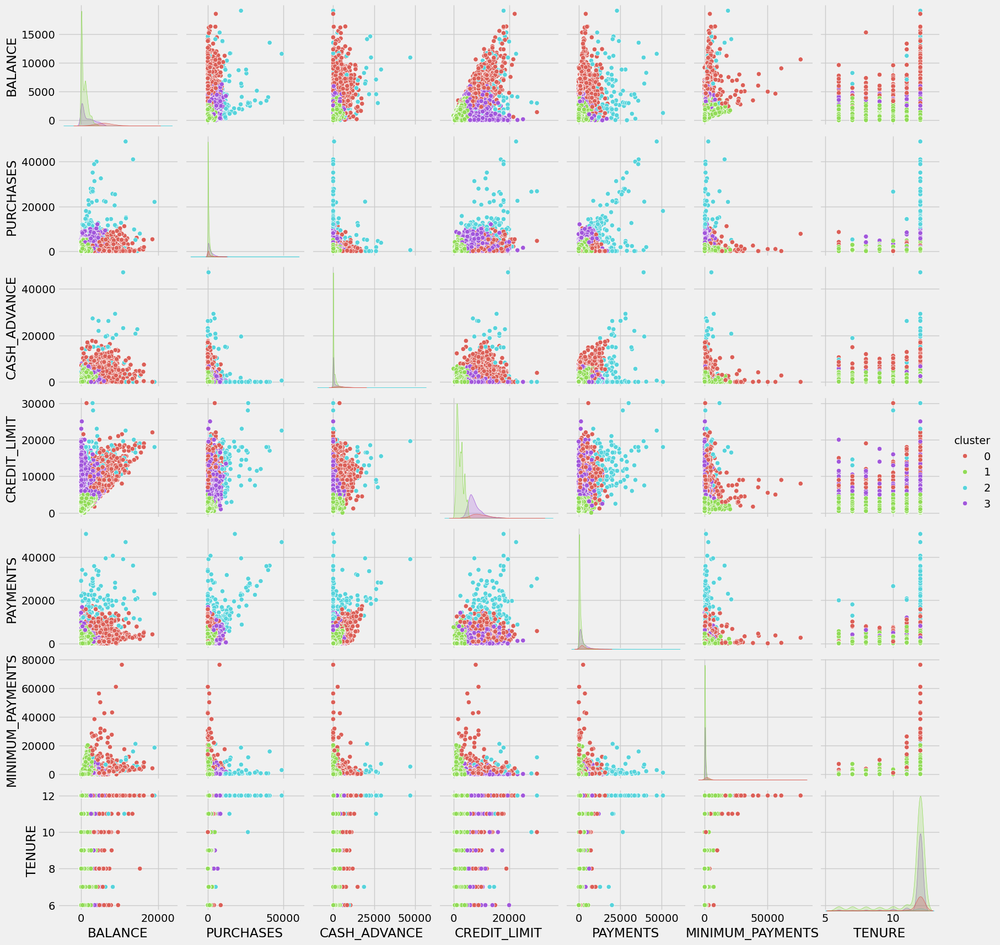

In [116]:
plt.figure(figsize=(25, 25))
sns.pairplot(df[best_columns], hue="cluster", palette=sns.color_palette("hls", 4))
plt.savefig('clusters.png')

After experimenting with various approaches, I ultimately settled on the Kmeans Model since the data only contains highly comparable tiny groups rather than disparate ones. As a result, I wasn't a fan of density-based algorithms. These kinds of algorithms can be used by me to look up serious credit card fraud clients. The goal of this study is to use consumer behaviors to segment customers.

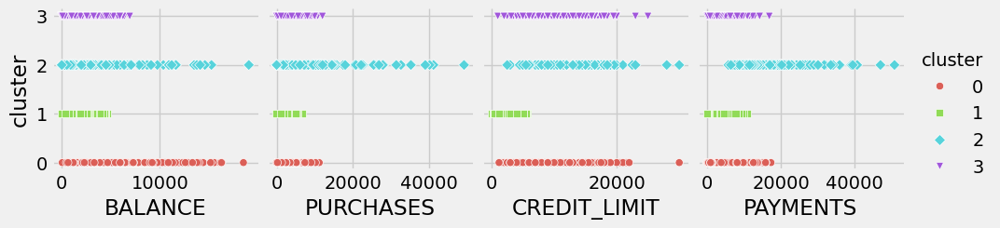

<Figure size 640x480 with 0 Axes>

In [118]:
palette = sns.color_palette("hls", 4)
sns.pairplot(df, 
             x_vars=['BALANCE', 'PURCHASES', 'CREDIT_LIMIT', 'PAYMENTS'], 
             y_vars=['cluster'], 
             hue='cluster', 
             palette=palette, 
             markers=["o", "s", "D", "v"])

plt.show()
plt.savefig('image.png', dpi=300, bbox_inches='tight')

**Cluster 0 (Red):**

*Profile:*

This group of customers has the lowest values across all features—BALANCE, PURCHASES, CREDIT_LIMIT, and PAYMENTS. They are likely light users of credit cards.

*Behavior:*

`BALANCE:` These customers maintain low balances, possibly because they do not rely heavily on credit. Their spending habits might be more cash-based, or they use their credit cards minimally.

`PURCHASES:` Their low purchase amounts suggest that these customers might use credit cards infrequently, possibly for occasional purchases or emergencies.

`CREDIT_LIMIT:` The low credit limits could indicate that these customers either have a limited credit history, leading to lower credit offers, or they prefer to keep their credit usage minimal.

`PAYMENTS:` With lower payment values, it's likely that these customers have smaller bills to settle, further reinforcing the idea that they are not heavy users of credit.

*Possible Demographic:*

These customers could be new to credit (e.g., young adults just starting to build their credit history) or individuals who prefer to avoid debt and therefore limit their credit card usage. They may also include customers who have credit cards primarily for emergencies rather than regular spending.

**Cluster 1 (Green):**

*Profile:*

This group has moderate balances and credit limits, but with lower purchases and payments. These customers might be managing their credit conservatively and with caution.

*Behavior:*

`BALANCE:` Customers in this cluster maintain moderate balances, indicating they use their credit cards but do not let their balances grow too high. They likely pay off a significant portion of their balances each month.

`PURCHASES:` The relatively low purchase amounts suggest a careful approach to spending, possibly due to budgeting constraints or a preference for financial stability.

`CREDIT_LIMIT:` The moderate credit limits indicate that these customers have established some credit history and are seen as reasonably low-risk by creditors, but they are not heavily leveraging their available credit.

`PAYMENTS:` Payments are relatively low, possibly because they are consistently paying down their balance and avoiding high-interest charges.

*Possible Demographic:*

These customers might be middle-income individuals who are financially responsible and cautious. They may prefer to live within their means, avoiding excessive debt. This cluster could also include older individuals who have a steady but modest income and manage their credit to maintain financial stability.

**Cluster 2 (Blue):**

*Profile:*

Customers in this cluster have higher balances, significant purchases, moderate-to-high credit limits, and substantial payments. They are active and engaged credit card users.

*Behavior:*

`BALANCE:` The higher balances indicate that these customers rely more on their credit cards, possibly using them as a primary payment method or for large, regular purchases.

`PURCHASES:` The high purchase values suggest frequent or significant spending, potentially indicating a lifestyle that involves higher expenditures, such as frequent travel, large household expenses, or business-related purchases.

`CREDIT_LIMIT:` Moderate to high credit limits reflect a strong credit history and trust from creditors, allowing these customers to leverage more credit.

`PAYMENTS:` Their substantial payments indicate that while they carry higher balances, they are also capable of managing and repaying their debts effectively, maintaining a healthy credit profile.

*Possible Demographic:*

This cluster likely includes higher-income individuals or families who use credit cards extensively, either for convenience or to maximize rewards. It may also include small business owners or professionals who rely on credit cards for significant business expenses. These customers are likely to be financially savvy and credit-conscious, with the means to handle larger balances and payments.

**Cluster 3 (Purple):**

*Profile:*

This group represents customers with the highest values across all features: balances, purchases, credit limits, and payments. These are likely high-value customers who use their credit cards extensively.

*Behavior:*

`BALANCE:` The very high balances suggest that these customers heavily rely on their credit cards, possibly as a form of short-term financing or for managing cash flow in the absence of immediate liquid funds.

`PURCHASES:` High purchase amounts indicate frequent and substantial spending. These customers may use their credit cards for virtually all types of transactions, from everyday expenses to luxury purchases.

`CREDIT_LIMIT:` The high credit limits reflect a strong relationship with creditors, likely built over years of consistent and responsible credit usage. These customers are trusted with large amounts of available credit.

`PAYMENTS:` The significant payments suggest that these customers are managing their high balances well, making large payments to maintain their credit standing and avoid interest charges. They likely pay off substantial portions of their balance regularly.

*Possible Demographic:*

These customers might be high-net-worth individuals, successful professionals, or business owners who have the financial means to utilize and repay large amounts of credit. They may be using their credit cards strategically for rewards, benefits, or cash flow management. This group likely values the convenience and perks of credit card usage and has the financial discipline to manage substantial credit obligations.